# Sound event detection with PANN

<img src="https://github.com/retkowsky/sound-event-detection/blob/main/SED.png?raw=true" width=800>

In [1]:
# %pip install panns_inference

In [2]:
# %pip install audio_metadata

In [3]:
import datetime
import librosa
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import panns_inference
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default='notebook'
import seaborn as sns
import sys
import time
import torch

from IPython.display import Audio
from IPython.display import IFrame
from PIL import Image
from panns_inference import AudioTagging, SoundEventDetection, labels

In [4]:
def get_device() -> str:
    """
    Get device type - either 'cuda' if GPU is available or 'cpu' otherwise.
    """
    import torch
    
    if torch.cuda.is_available():
        device = "cuda"
        print("GPU is available")
    else:
        device = "cpu"
        print("No GPU")
    
    return device


In [5]:
device = get_device()

No GPU


In [6]:
print("Today:", datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S'))

Today: 26-Jul-2023 09:26:35


In [7]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

## Functions

In [8]:
def display_amplitude(audio_file: str) -> None:
    """
    Get amplitude plot from a local audio file

    Parameters:
        audio_file (str): Path to the local audio file.
        figsize (tuple): Figure size (width, height) in inches. Default is (15, 5).

    Returns:
        None
    """
    plt.figure(figsize=(15, 5))

    # Reading the sound file
    y, sr = librosa.load(audio_file)
    # Amplitude plot
    time = librosa.times_like(y, sr=sr) / 1000
    plt.plot(time, y)

    title = "Waveplot: " + audio_file
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Time (secs)", fontdict=dict(size=12))
    plt.ylabel("Amplitude", fontdict=dict(size=12))

    plt.show()

In [9]:
def format_seconds(seconds: float) -> str:
    """
    Format seconds into minutes and remaining seconds.

    Args:
        seconds (float): The total number of seconds.

    Returns:
        str: A formatted string in the format "minutes minutes and remaining_seconds seconds".
    """
    minutes = int(seconds // 60)
    remaining_seconds = round(seconds % 60, 3)
    
    return f"{minutes} minutes and {remaining_seconds} seconds"


In [10]:
def get_audio_metadata(audio_file):
    """
    Prints audio metadata generated from an audio file.
    
    Parameters:
        audio_file (str): The path to the audio file.

    Prints:
        Audio statistics including file information and stream info.
    """
    import audio_metadata

    audiofilemetadata = audio_metadata.load(audio_file)
    audio_format = audiofilemetadata.streaminfo.audio_format
    bit_depth = audiofilemetadata.streaminfo.bit_depth
    bitrate = audiofilemetadata.streaminfo.bitrate
    nb_channels = audiofilemetadata.streaminfo.channels
    duration = audiofilemetadata.streaminfo.duration
    sample_rate = audiofilemetadata.streaminfo.sample_rate
    audio_filesize = audiofilemetadata.filesize
    last_modified_date = time.ctime(os.path.getmtime(audio_file))
    creation_date = time.ctime(os.path.getctime(audio_file))

    print("\n", "-" * 30, "Audio Statistics", "-" * 30, "\n")
    print("Audio File:\t", audio_file)
    print("Modified Date:\t", last_modified_date)
    print("Creation Date:\t", creation_date)
    print("File Size:\t", audio_filesize)
    print("Audio Format:\t", audio_format)
    print("Bit Depth:\t", bit_depth)
    print("Bit Rate:\t", bitrate)
    print("Sampling Rate:\t", sample_rate)
    print("Nb of Channels:\t", nb_channels)
    print("Duration (sec):\t", round(duration, 3), "(", format_seconds(duration), ")")

In [11]:
def audio_tags(audio_file, nb=10):
    """
    Get audio tags for the given audio file.

    Args:
        audio_file (str): Path to the audio file.
        nb (int, optional): Number of top tags to retrieve. Defaults to 10.

    Returns:
        pd.DataFrame: DataFrame containing the top audio tags and their probabilities.
                      Columns: "audio_event" (tag name), "probability" (probability value).
    """
    (audio, _) = librosa.core.load(audio_file, sr=32000, mono=True)
    audiotag = AudioTagging(checkpoint_path=None, device=device)
    (clipwise_output, embedding) = audiotag.inference(audio[None, :])

    sorted_indexes = np.argsort(clipwise_output[0])[::-1]

    df = pd.DataFrame(columns=["audio_event", "probability"])
    event_values = []
    prob_values = []

    for k in range(nb):
        event = np.array(labels)[sorted_indexes[k]]
        prob = clipwise_output[0][sorted_indexes[k]]
        event_values.append(event)
        prob_values.append(prob)
        df = pd.DataFrame(
            {"audio_event": event_values, "probability": prob_values}
        ).sort_values("probability", ascending=False)

    return df


In [12]:
def display_plot(audio_file):
    """
    Plot sound events.

    Parameters:
        audio_file (str): Path to the audio file.

    Returns:
        str: Path to the saved HTML file.
    """
    (audio, _) = librosa.core.load(audio_file, sr=32000, mono=True)

    # Sound Event Detection
    sed = SoundEventDetection(
        checkpoint_path=None,
        device=device,
        interpolate_mode="nearest",
    )
    framewise_output = sed.inference(audio[None, :])[0]
    classwise_output = np.max(framewise_output, axis=0)
    idxes = np.argsort(classwise_output)[::-1]
    idxes = idxes[0:5]
    index_to_label_mapping = {i: label for i, label in enumerate(labels)}

    fig = go.Figure()

    for idx in idxes:
        fig.add_trace(
            go.Scatter(
                x=list(range(len(framewise_output))),
                y=framewise_output[:, idx],
                mode="lines",
                fill="tozeroy",
                name=index_to_label_mapping[idx],
            )
        )

    if len(framewise_output) > 10000:
        space = 1000
    elif len(framewise_output) > 5000:
        space = 500
    else:
        space = 100

    ticktext = list(range(0, len(framewise_output), space))
    ticktext = [x / 100 for x in ticktext]

    y_values = [round(i * 0.1, 1) for i in range(11)]

    fig.update_layout(
        title="Sound event detection on audio file: " + audio_file,
        xaxis_title="Seconds",
        yaxis_title="Probability",
        showlegend=True,
        legend_title="Events",
        xaxis=dict(tickmode="array",
            tickvals=list(range(0, len(framewise_output), space)),
            ticktext=ticktext,
        ),
        yaxis=dict(tickmode="array", tickvals=y_values),
        template = "ggplot2",
    )

    output_file = os.path.join(RESULT_DIR, os.path.splitext(audio_file)[0].split("/")[-1] + ".html")
    pio.write_html(fig, output_file)
    print("File saved:", output_file)
    
    return output_file


## Testing

In [13]:
AUDIO_DIR = "audio"

In [14]:
!ls $AUDIO_DIR -lh

total 15M
-rwxrwxrwx 1 root root 4.2M Jul 25 13:03 call.wav
-rwxrwxrwx 1 root root 8.3M Jul 25 13:12 city.wav
-rwxrwxrwx 1 root root  66K Jul 25 13:10 come_get_it.wav
-rwxrwxrwx 1 root root 400K Jul 25 13:37 cough.wav
-rwxrwxrwx 1 root root 1.5M Jul 24 15:35 phone.wav


In [15]:
RESULT_DIR = "export"

os.makedirs(RESULT_DIR, exist_ok=True)

### Test 1

In [16]:
audio_file = os.path.join(AUDIO_DIR, "phone.wav")

get_audio_metadata(audio_file)


 ------------------------------ Audio Statistics ------------------------------ 

Audio File:	 audio/phone.wav
Modified Date:	 Mon Jul 24 15:35:15 2023
Creation Date:	 Mon Jul 24 15:35:15 2023
File Size:	 1527670
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration (sec):	 8.66 ( 0 minutes and 8.66 seconds )


In [17]:
Audio(audio_file, autoplay=False)

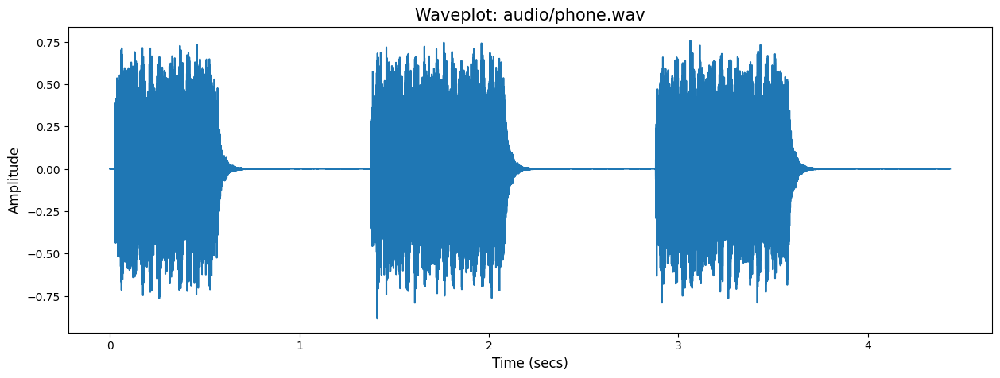

In [18]:
display_amplitude(audio_file)

In [19]:
df = audio_tags(audio_file).style.background_gradient(cmap="Greens")
df

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


,audio_event,probability
0,Telephone bell ringing,0.776561
1,Telephone,0.316614
2,Ringtone,0.291880
3,Speech,0.050654
4,"Inside, small room",0.046975
5,Music,0.026897
6,Animal,0.007873
7,"Inside, large room or hall",0.006982
8,Vehicle,0.005301
9,"Outside, rural or natural",0.005146


In [20]:
output_file = display_plot(audio_file)
IFrame(output_file, width=940, height=640)

Checkpoint path: /home/azureuser/panns_data/Cnn14_DecisionLevelMax.pth
Using CPU.
File saved: export/phone.html


### Test 2

In [21]:
audio_file = os.path.join(AUDIO_DIR, "call.wav")

get_audio_metadata(audio_file)


 ------------------------------ Audio Statistics ------------------------------ 

Audio File:	 audio/call.wav
Modified Date:	 Tue Jul 25 13:03:19 2023
Creation Date:	 Tue Jul 25 13:03:19 2023
File Size:	 4387946
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 24
Bit Rate:	 2304000
Sampling Rate:	 48000
Nb of Channels:	 2
Duration (sec):	 15.236 ( 0 minutes and 15.236 seconds )


In [22]:
Audio(audio_file, autoplay=False)

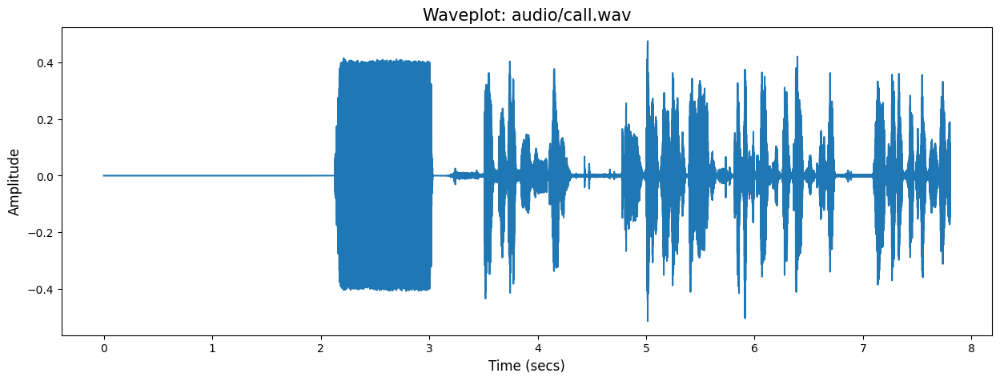

In [23]:
display_amplitude(audio_file)

In [24]:
df = audio_tags(audio_file).style.background_gradient(cmap="Greens")
df

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


,audio_event,probability
0,Dial tone,0.936149
1,Speech,0.919217
2,"Inside, small room",0.339344
3,Telephone,0.312462
4,"Telephone dialing, DTMF",0.212526
5,Sidetone,0.042993
6,Telephone bell ringing,0.039728
7,Music,0.022494
8,Conversation,0.019275
9,Silence,0.010105


In [25]:
output_file = display_plot(audio_file)
IFrame(output_file, width=940, height=640)

Checkpoint path: /home/azureuser/panns_data/Cnn14_DecisionLevelMax.pth
Using CPU.
File saved: export/call.html


### Test 3

In [26]:
audio_file = os.path.join(AUDIO_DIR, "city.wav")

get_audio_metadata(audio_file)


 ------------------------------ Audio Statistics ------------------------------ 

Audio File:	 audio/city.wav
Modified Date:	 Tue Jul 25 13:12:21 2023
Creation Date:	 Tue Jul 25 13:12:21 2023
File Size:	 8669072
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 24
Bit Rate:	 2304000
Sampling Rate:	 48000
Nb of Channels:	 2
Duration (sec):	 30.101 ( 0 minutes and 30.101 seconds )


In [27]:
Audio(audio_file, autoplay=False)

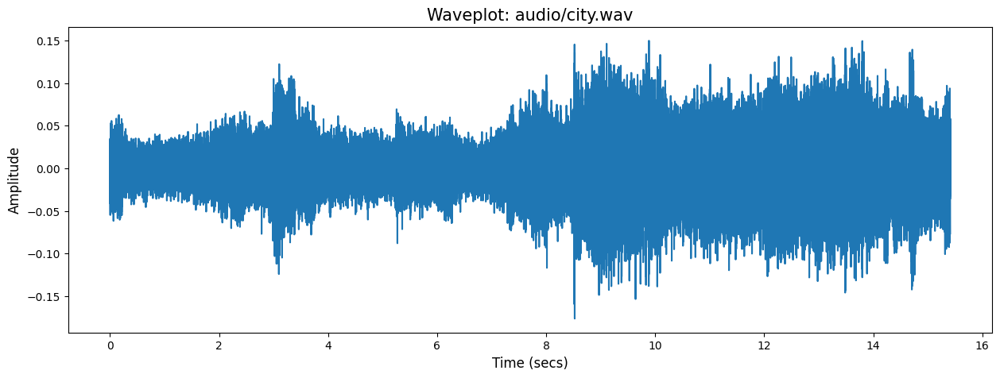

In [28]:
display_amplitude(audio_file)

In [29]:
df = audio_tags(audio_file).style.background_gradient(cmap="Greens")
df

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


,audio_event,probability
0,Vehicle,0.755360
1,Car,0.417149
2,Emergency vehicle,0.313917
3,"Traffic noise, roadway noise",0.265390
4,Truck,0.260567
5,Police car (siren),0.224600
6,Motor vehicle (road),0.216632
7,Air brake,0.143867
8,Siren,0.142597
9,"Fire engine, fire truck (siren)",0.141413


In [30]:
output_file = display_plot(audio_file)
IFrame(output_file, width=940, height=640)

Checkpoint path: /home/azureuser/panns_data/Cnn14_DecisionLevelMax.pth
Using CPU.
File saved: export/city.html


### Test 4

In [31]:
audio_file = os.path.join(AUDIO_DIR, "come_get_it.wav")

get_audio_metadata(audio_file)


 ------------------------------ Audio Statistics ------------------------------ 

Audio File:	 audio/come_get_it.wav
Modified Date:	 Tue Jul 25 13:10:03 2023
Creation Date:	 Tue Jul 25 13:10:03 2023
File Size:	 66613
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 8
Bit Rate:	 88200
Sampling Rate:	 11025
Nb of Channels:	 1
Duration (sec):	 6.038 ( 0 minutes and 6.038 seconds )


In [32]:
Audio(audio_file, autoplay=False)

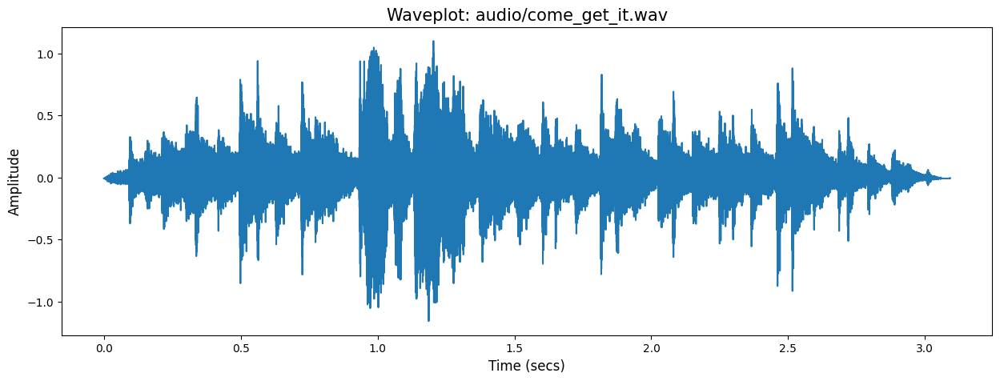

In [33]:
display_amplitude(audio_file)

In [34]:
df = audio_tags(audio_file).style.background_gradient(cmap="Greens")
df

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


,audio_event,probability
0,Speech,0.362315
1,Wind chime,0.232476
2,Glass,0.158919
3,Chime,0.150778
4,Tubular bells,0.150644
5,Music,0.137905
6,"Chink, clink",0.112285
7,Bell,0.071962
8,"Marimba, xylophone",0.044550
9,Cowbell,0.043517


In [35]:
output_file = display_plot(audio_file)
IFrame(output_file, width=940, height=640)

Checkpoint path: /home/azureuser/panns_data/Cnn14_DecisionLevelMax.pth
Using CPU.
File saved: export/come_get_it.html


## Test 5

In [36]:
audio_file = os.path.join(AUDIO_DIR, "cough.wav")

get_audio_metadata(audio_file)


 ------------------------------ Audio Statistics ------------------------------ 

Audio File:	 audio/cough.wav
Modified Date:	 Tue Jul 25 13:37:40 2023
Creation Date:	 Tue Jul 25 13:37:40 2023
File Size:	 409038
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 768000
Sampling Rate:	 48000
Nb of Channels:	 1
Duration (sec):	 4.26 ( 0 minutes and 4.26 seconds )


In [37]:
Audio(audio_file, autoplay=False)

In [38]:
df = audio_tags(audio_file).style.background_gradient(cmap="Greens")
df

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


,audio_event,probability
0,Throat clearing,0.773382
1,Grunt,0.049371
2,"Burping, eructation",0.030422
3,Cough,0.023195
4,Music,0.019929
5,Sound effect,0.016136
6,Speech,0.014804
7,Scrape,0.014384
8,Sneeze,0.009152
9,Groan,0.008339


In [39]:
output_file = display_plot(audio_file)
IFrame(output_file, width=940, height=640)

Checkpoint path: /home/azureuser/panns_data/Cnn14_DecisionLevelMax.pth
Using CPU.
File saved: export/cough.html
